In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import time
from matplotlib.colors import LightSource

In [2]:
ls = LightSource(azdeg=315, altdeg=45)

In [34]:
p1=0.5
N=101
N_step=500+4
D_0=np.zeros((N,N))
#t_0=time.clock()
#D_0=np.random.choice(a=np.arange(2),p=[p1,1-p1],size=(N,N))
#D_0=[[(i+j)%(N//4) for i in range(N)]for j in range(N)]
#D_0[0][0]=1
#D_0=np.isclose(D_0,np.zeros((N,N)))

D_t=np.isclose(0,np.zeros((N,N)))
#D_t=np.copy(D_0)
#G=np.zeros((N_step,N,N))
#G_0=np.random.choice(a=np.arange(2),p=[p1,1-p1],size=(N,N))
#G_0=[[(i+j)%2 for i in range(N)]for j in range(N)]
# G_0=np.zeros((N,N))+D_0
# #G_0[0][0]=1-G_0[0][0]
# mm=0
# nn=0
# G_0[mm][nn]=np.logical_not(G_0[mm][nn])
# mm=N-mm-1
# nn=N-nn-1
# G_0[mm][nn]=np.logical_not(G_0[mm][nn])
# G_0=np.isclose(G_0,np.zeros((N,N)))
G_t=np.isclose(0,np.zeros((N,N)))
#G_t=np.copy(G_0)
nn=N-1
mm=(N-1)//2
G_t[mm][nn]=np.logical_not(G_t[mm][nn])
# mm=0
# nn=0
# G_t[mm][nn]=np.logical_not(G_t[mm][nn])
# mm=0
# nn=N-1
# G_t[mm][nn]=np.logical_not(G_t[mm][nn])
BB=[]
DD=[]
TEST=[]
for i in range(N_step):

    #D[i]=D_t
    Tu=np.roll(D_t,-1,0)
    Td=np.roll(D_t,1,0)
    Tl=np.roll(D_t,1,1)
    Tr=np.roll(D_t,-1,1)
    D_t=np.logical_xor(np.logical_xor(Tu,Td),np.logical_xor(Tl,Tr))

    #G[i]=G_t
    Tu=np.roll(G_t,-1,0)
    Td=np.roll(G_t,1,0)
    Tl=np.roll(G_t,1,1)
    Tr=np.roll(G_t,-1,1)
    G_t=np.logical_xor(np.logical_xor(Tu,Td),np.logical_xor(Tl,Tr))
    if (i < 10 and i % 1 == 0):
        BB.append(np.logical_xor(D_t,G_t))
        TEST.append(G_t)
    if (i > N_step-10 and i < N_step):
        DD.append(np.logical_xor(D_t,G_t))




In [21]:
def evolve2(G_t,p=1,seed=0):
    np.random.seed(seed)
    Tu=np.roll(G_t,-1,0)
    Td=np.roll(G_t,1,0)
    Tl=np.roll(G_t,1,1)
    Tr=np.roll(G_t,-1,1)
    
    A=[]
    A.append(np.logical_xor(Tu,Td))           ####UD
    A.append(np.logical_xor(Tu,Tl))
    A.append(np.logical_xor(Tu,Tr))
    A.append(np.logical_xor(Td,Tr))
    A.append(np.logical_xor(Td,Tl))
    A.append(np.logical_xor(Tl,Tr))           ####LR
    q=(1-p)/4
    B=np.random.choice(a=np.arange(6),p=[p/2,q,q,q,q,p/2],size=2,replace=False)
    G_t=np.logical_xor(A[B[0]],A[B[1]])
    return G_t

def evolve(G_t,x=0,y=0):
    #np.random.seed(seed)
    #G_t=np.roll(G_t,np.random.choice([-1,1],p=[0.3,0.7]),np.random.choice([0,1],p=[0.4,0.6]))
    G_t=np.roll(G_t,x,y)
    Tu=np.roll(G_t,-1,0)
    Td=np.roll(G_t,1,0)
    Tl=np.roll(G_t,1,1)
    Tr=np.roll(G_t,-1,1)
    G_t=np.logical_xor(np.logical_xor(Tu,Td),np.logical_xor(Tl,Tr))
    return G_t

In [39]:
a=np.zeros(8)
a[::2]=1
a[1::2]=2
a

array([1., 2., 1., 2., 1., 2., 1., 2.])

In [28]:
image.shape

(1168, 1168, 4)

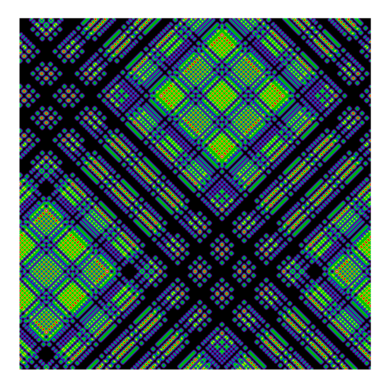

In [50]:
file="C:/Users/jhash/Pictures/generative_pics/Pictor/ACT2/Periodic_Game_of_life_Python_New_Media_20x20.png"
image=plt.imread(file)
height,width,col=image.shape
image_output=np.zeros((height*2,width*2,col))
image_output[::2,::2,:]=image
image_output[1::2,1::2,:]=image
image_output[1::2,::2,:]=image
image_output[::2,1::2,:]=image
image_output[:,:,3]=1
plt.axis('off')
plt.imshow(image_output,interpolation='Bilinear',cmap='nipy_spectral')
plt.savefig('C:/Users/jhash/Pictures/generative_pics/Pictor/CA_final_upgrade.png',dpi=600, bbox_inches='tight',pad_inches=0)


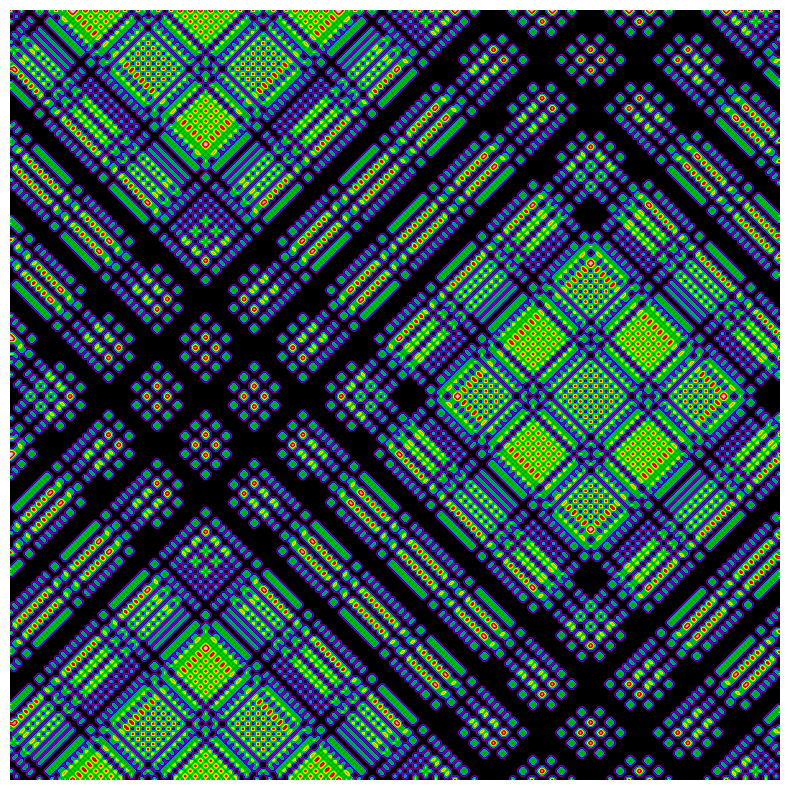

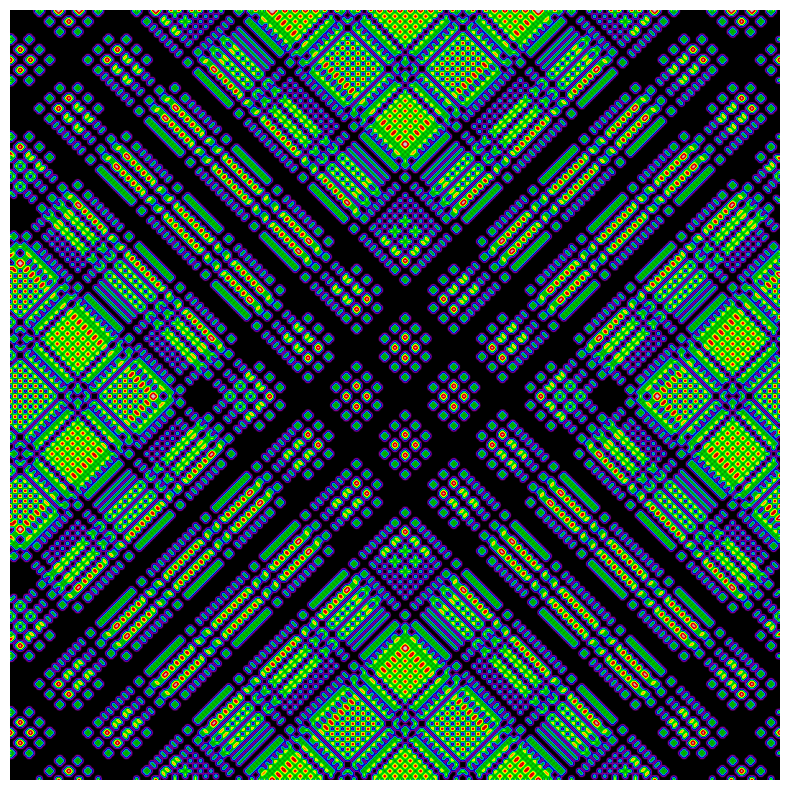

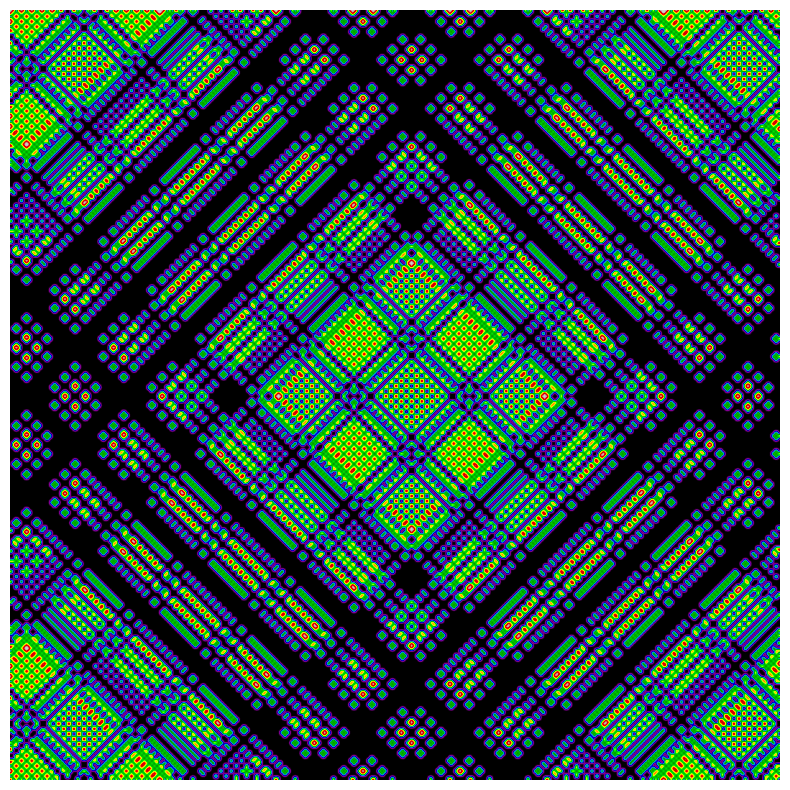

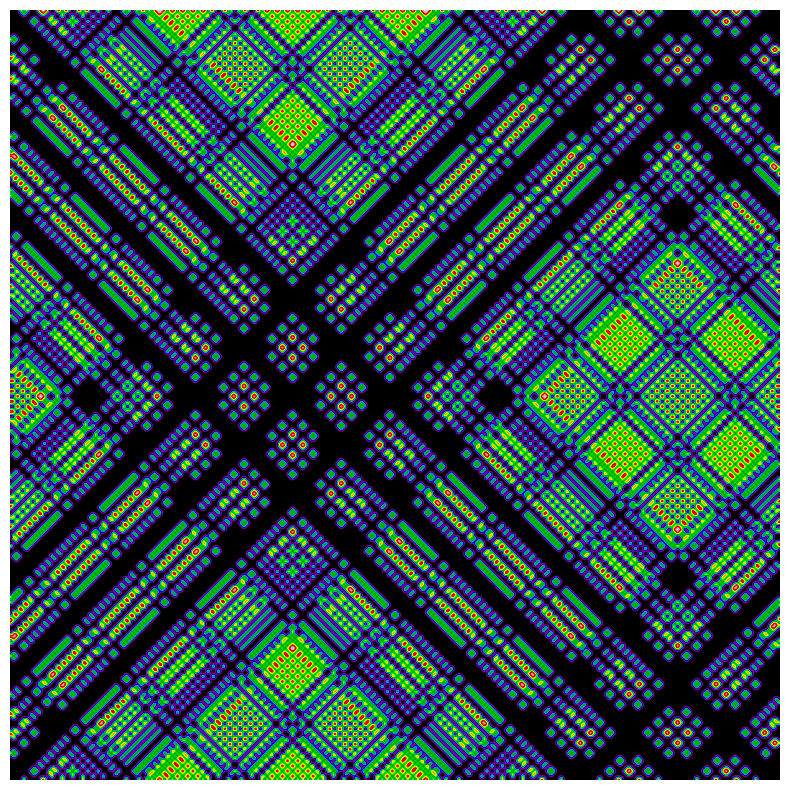

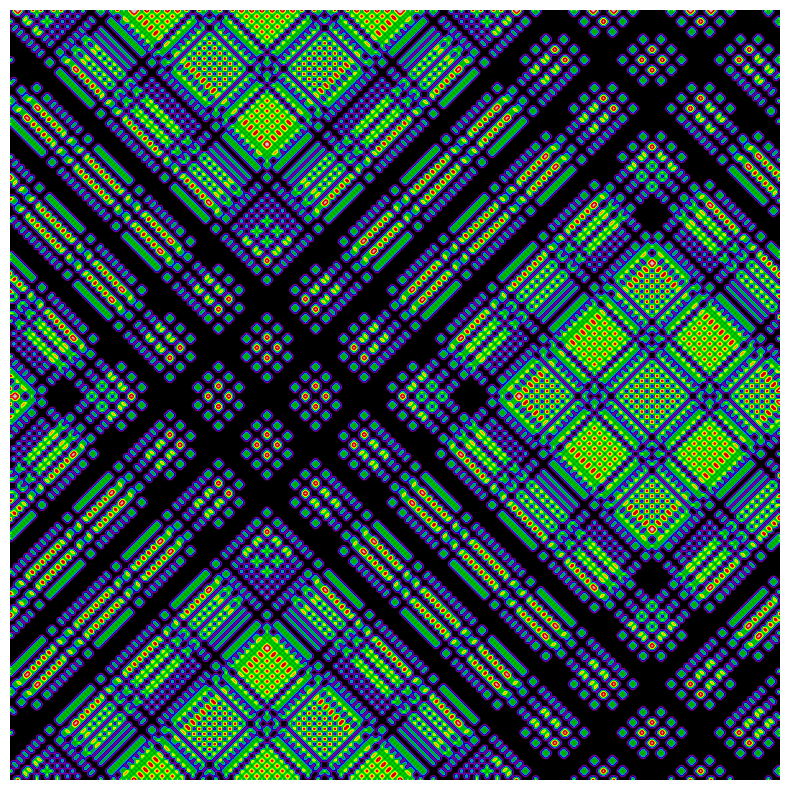

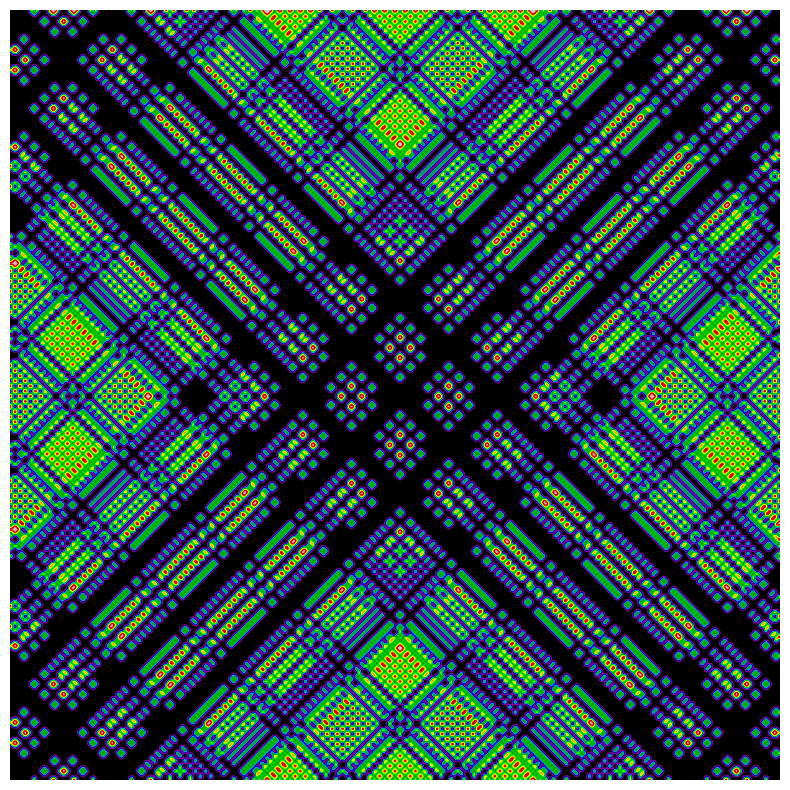

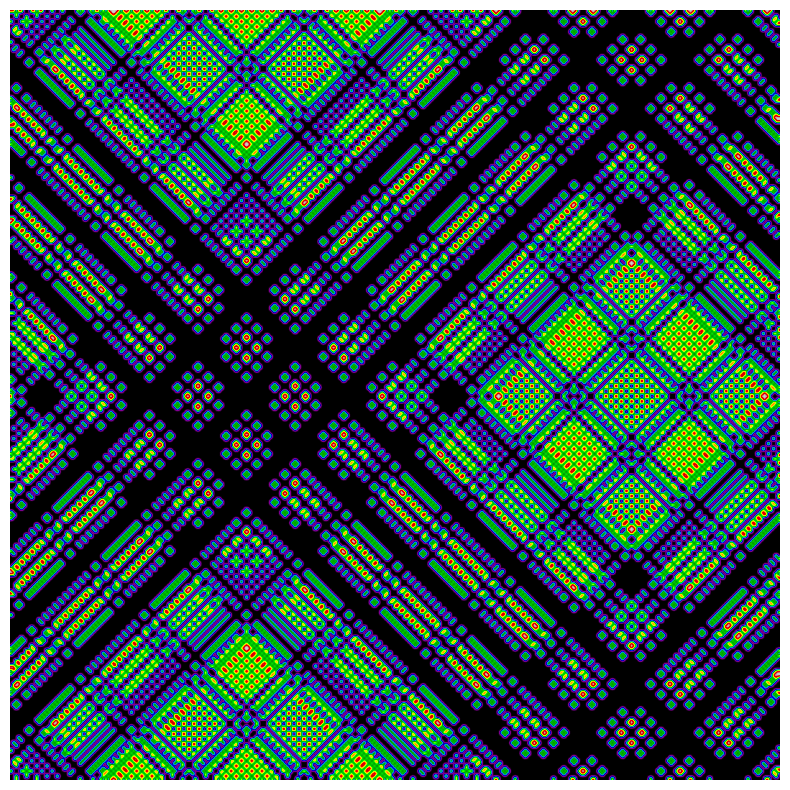

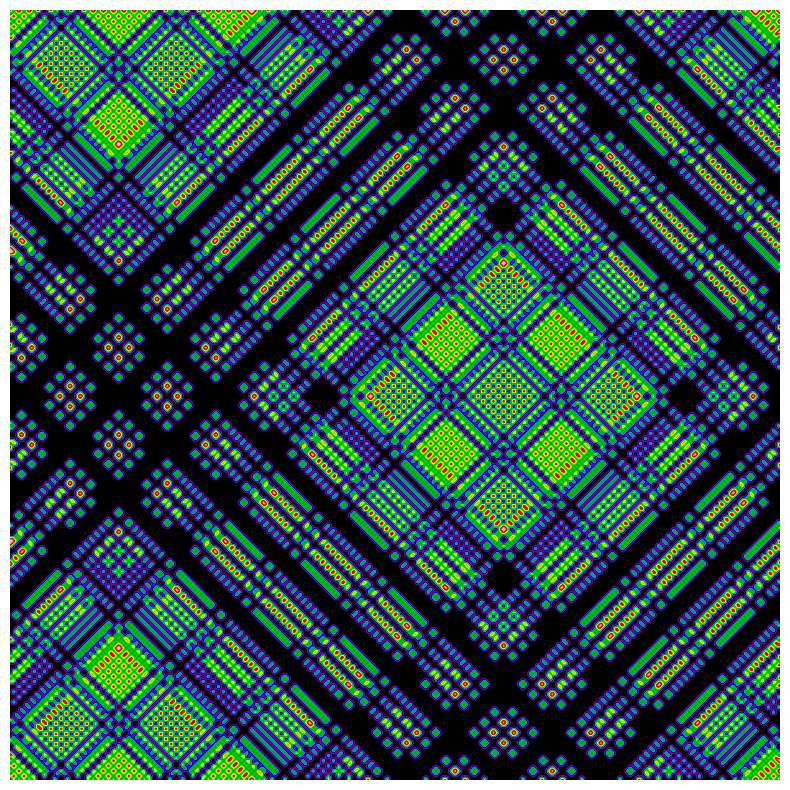

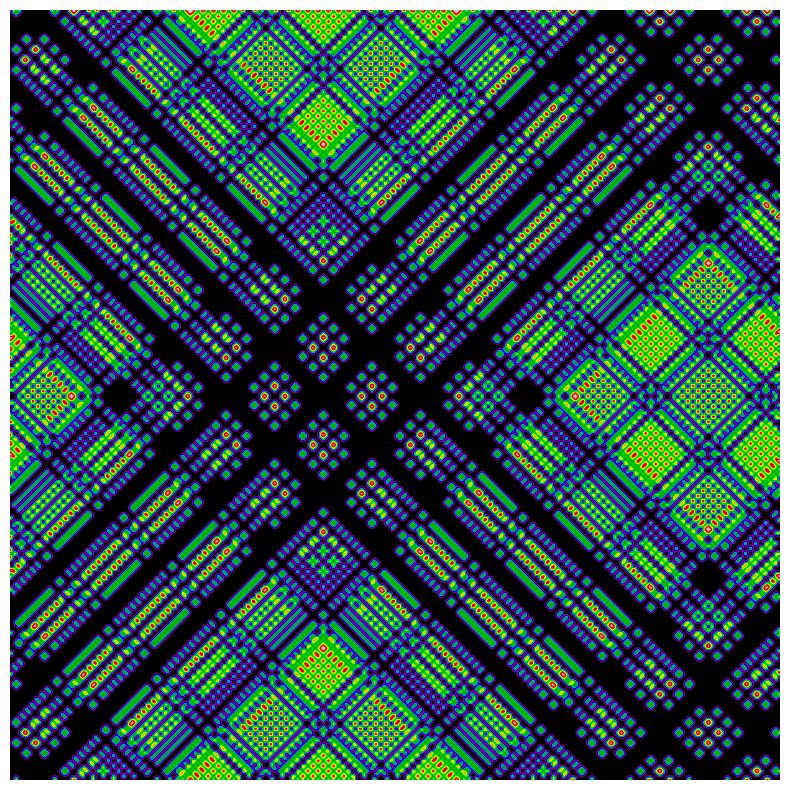

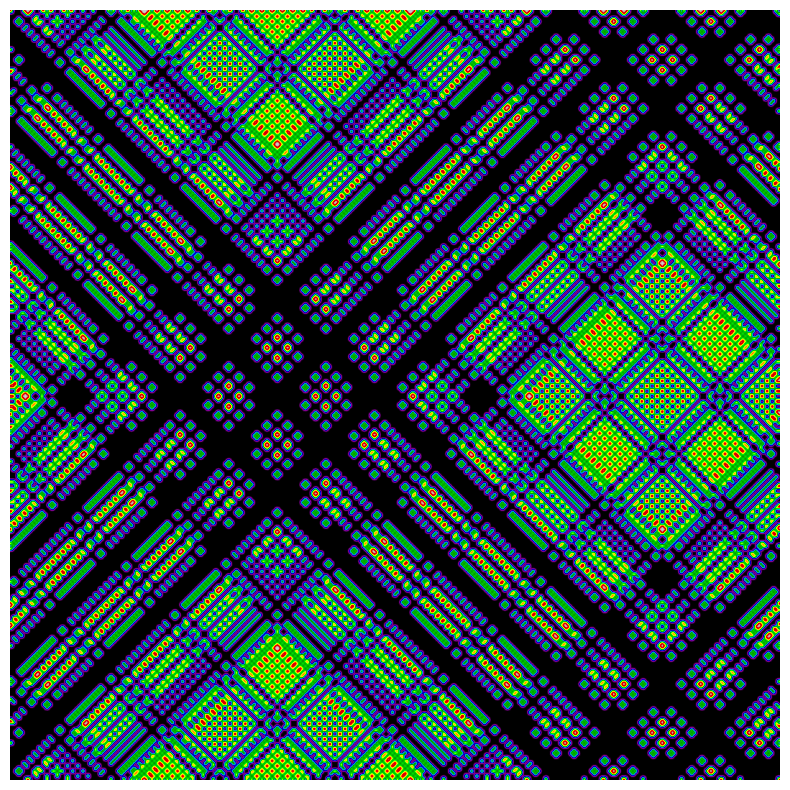

In [26]:
N=301
N_step=2000
nn=5
for j in range(10):
    G_t=np.isclose(0,np.zeros((N,N)))
    G_t[0,0]=np.logical_not(G_t[0,0])
    #G=np.random.choice(a=[True,False],p=[0.9,0.1],size=(N,N))
    np.random.seed(j)
    x=np.random.choice([-1,1],p=[0.4,0.6],size=N_step)
    y=np.random.choice([-1,1],p=[0.4,0.6],size=N_step)
    for i in range(N_step):   
        G_t=evolve(G_t,x[i],y[i])
        #if (i > N_step-nn*10 and i % 10 == 0) or (i > N_step-nn) or (i > N_step-nn*100 and i % 100 == 0):
        if i==1980:
            plt.figure(figsize=(10,10))
            plt.axis('off')
            plt.imshow(G_t,interpolation='bicubic',cmap='nipy_spectral')
            plt.savefig('C:/Users/jhash/Pictures/generative_pics/Pictor/CA_trial/CA_final_idx={0}_num={1}_d={2}.png'.format(i,j,N),dpi=300, bbox_inches='tight')
        


KeyboardInterrupt: 

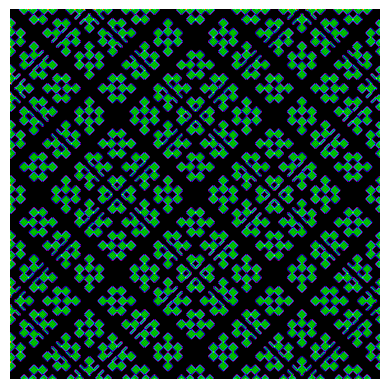

In [45]:
N=301
N_step=2000
nn=5
for p in [0.5,0.9]:
    for seed in range(2):
        G_t=np.isclose(0,np.zeros((N,N)))
        G_t[0,0]=np.logical_not(G_t[0,0])
        for i in range(N_step):
            G_t=evolve2(G_t,p,seed)
            if (i > N_step-nn*10 and i % 10 == 0) or (i > N_step-nn) or (i > N_step-nn*100 and i % 100 == 0):
                plt.axis('off')
                plt.imshow(G_t,interpolation='bicubic',cmap='nipy_spectral')
                plt.savefig('C:/Users/jhash/Pictures/Pix/Pictor/CA_trial/CA_idx={0}_p={1}_seed={2}_d={3}.png'.format(i,p,seed,N),dpi=300, bbox_inches='tight')
        


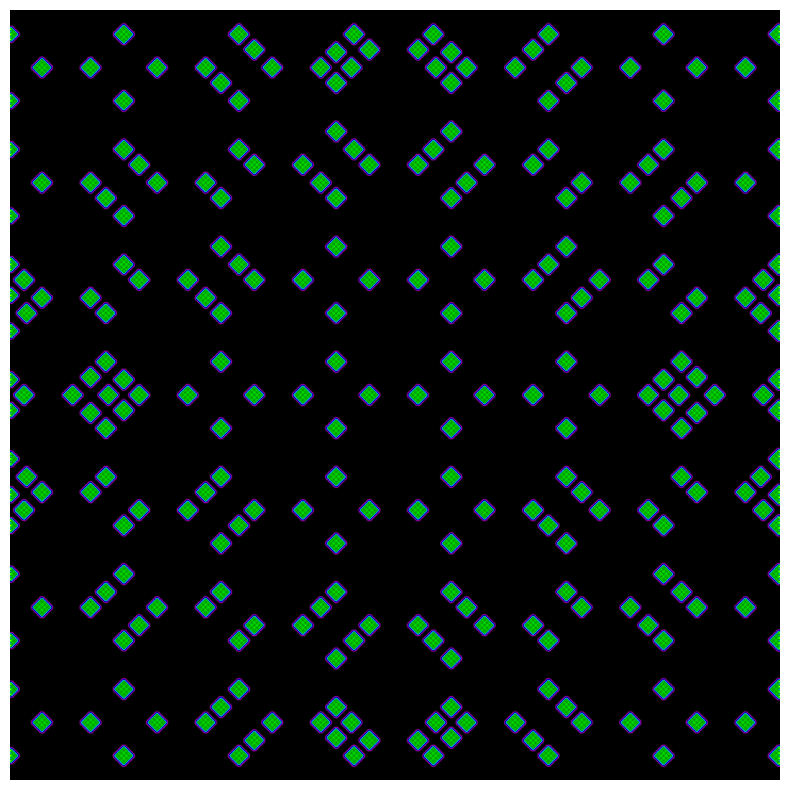

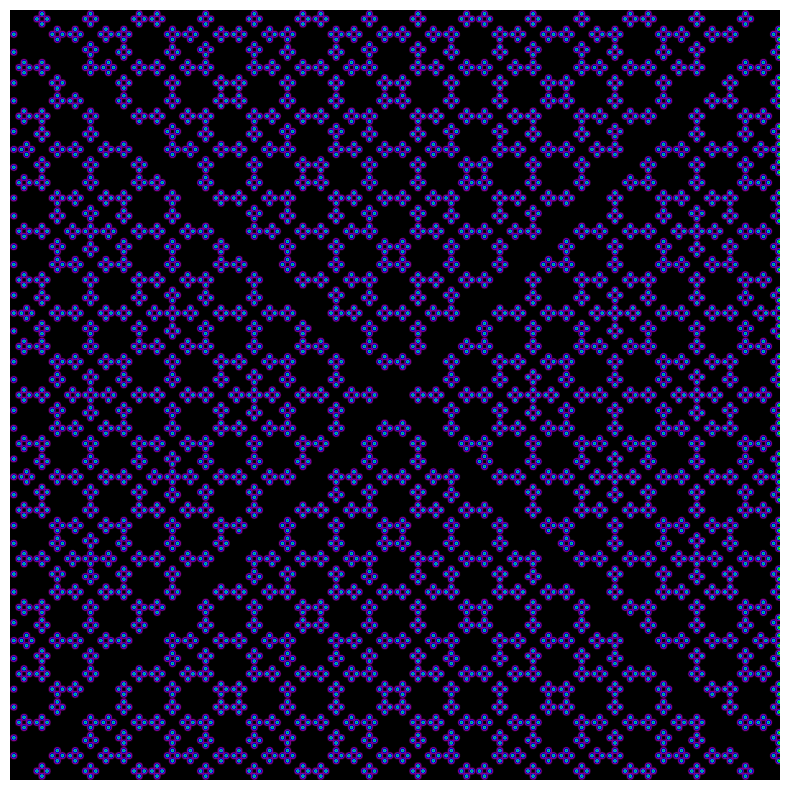

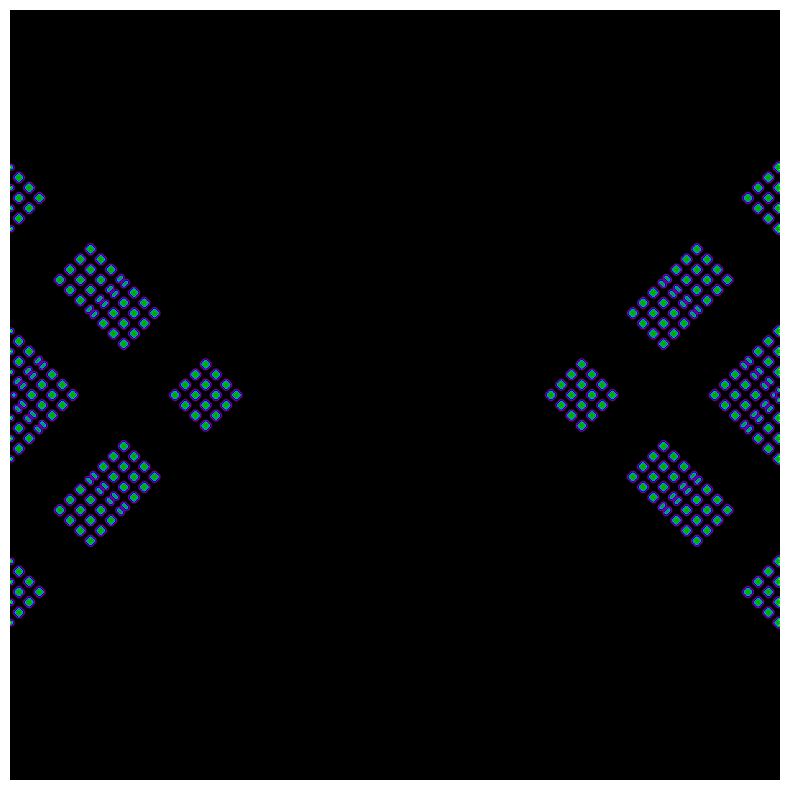

In [27]:
i=2
plt.figure(figsize=(10,10))
plt.imshow(BB[i],interpolation='bicubic',cmap='nipy_spectral')
plt.axis('off')
plt.show()
plt.figure(figsize=(10,10))
plt.imshow(DD[i],interpolation='bicubic',cmap='nipy_spectral')
plt.axis('off')
plt.show()
plt.figure(figsize=(10,10))
plt.imshow(FF[i],interpolation='bicubic',cmap='nipy_spectral')
plt.axis('off')
plt.show()

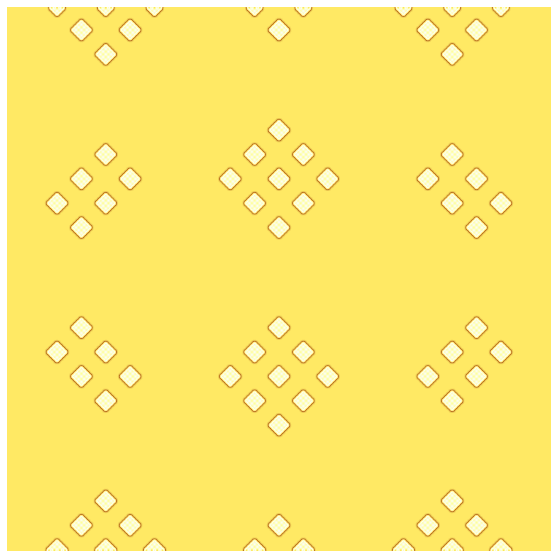

In [80]:
#rgb = ls.shade(BB, cmap=plt.cm.copper, vert_exag=1, blend_mode='overlay')
# plt.figure(figsize=(7,7))
#plt.imshow(rgb,interpolation='bicubic',cmap='jet')
# plt.imshow(BB,interpolation='bicubic')
# plt.axis('off')
# plt.show()
# plt.imshow(D_t,interpolation='bicubic')
# plt.axis('off')
# plt.show()
# plt.imshow(G_t,interpolation='bicubic')
# plt.axis('off')
# plt.show()
#plt.imshow(np.logical_xor(D_t,G_t))
#print(time.clock()-t_0)
plt.figure(figsize=(10,10))
plt.imshow(BB[4],interpolation='bicubic',cmap=gold_1)
plt.axis('off')
plt.show()

["'H' is not recognized as an internal or external command,",
 'operable program or batch file.']

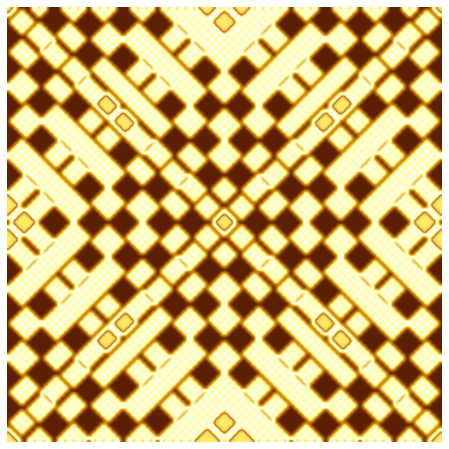

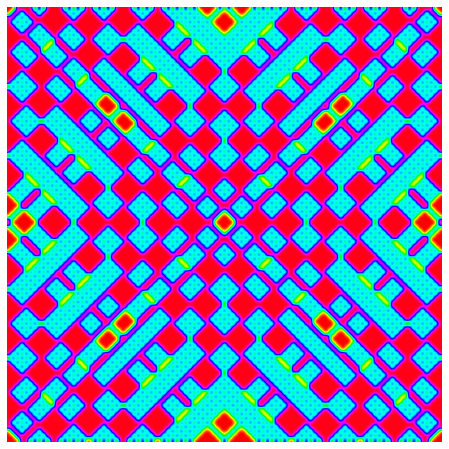

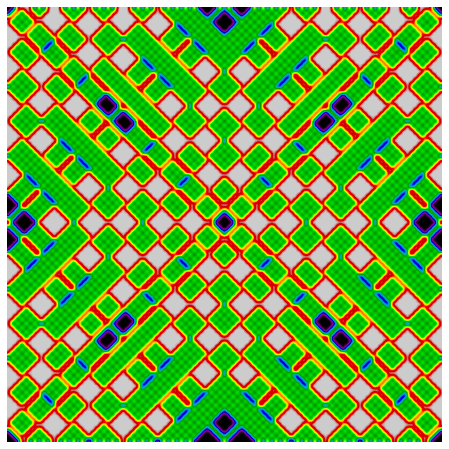

In [61]:
H=BB[0]
cmap_list=[gold_1,'hsv','nipy_spectral']
H=np.logical_not(H)
for cmap in cmap_list:
    plt.figure(figsize=(8,8))
    plt.imshow(H,interpolation='bicubic',cmap=cmap)
    plt.axis('off')
    plt.show()

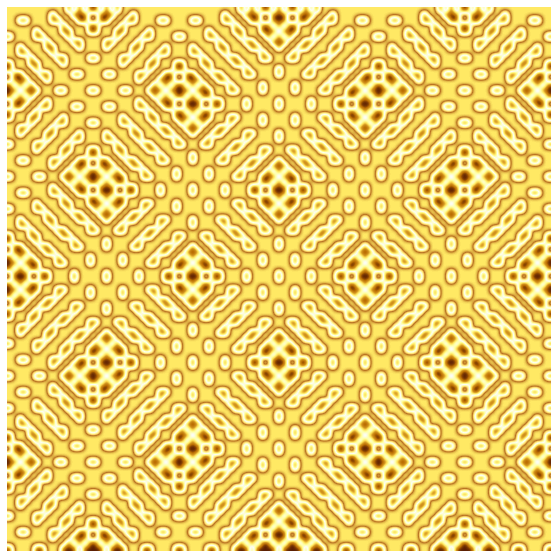

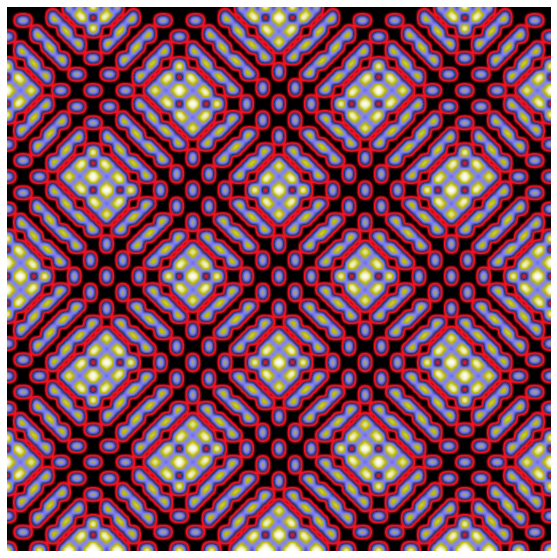

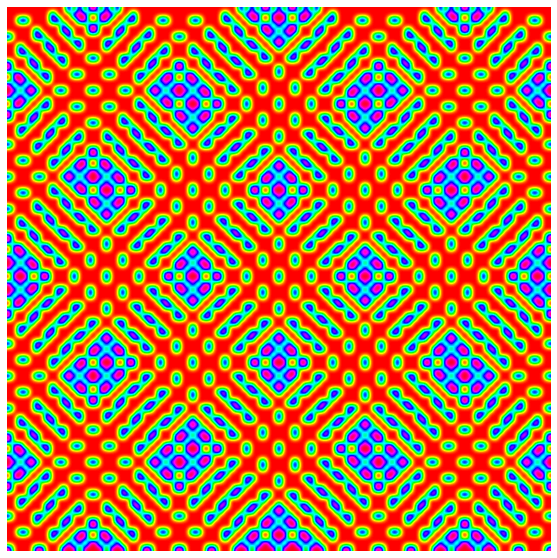

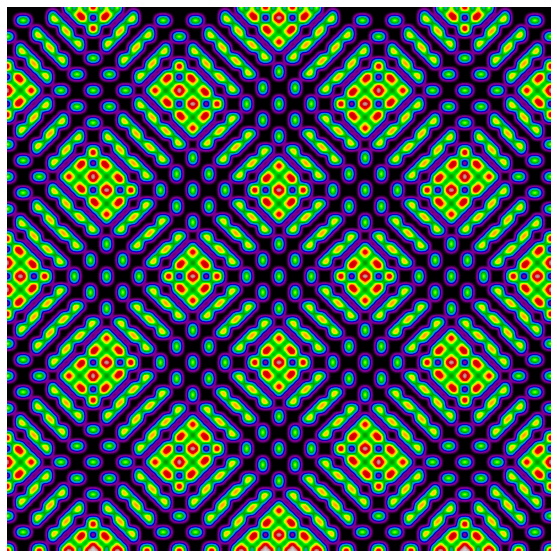

In [15]:

H=BB[9]
plt.figure(figsize=(10,10))
plt.imshow(H,interpolation='bicubic',cmap=gold_1)
plt.axis('off')
plt.show()
plt.figure(figsize=(10,10))
plt.imshow(H,interpolation='bicubic',cmap='gist_stern')
plt.axis('off')
plt.show()
plt.figure(figsize=(10,10))
plt.imshow(H,interpolation='bicubic',cmap='hsv')
plt.axis('off')
plt.show()
plt.figure(figsize=(10,10))
plt.imshow(H,interpolation='bicubic',cmap='nipy_spectral')
plt.axis('off')
plt.show()

In [5]:
from matplotlib import colors
color_list_gold_1=['#FFE964','#BA7322','#FFDC6D','#FFFFB5','#FCFDF6','#FFFF9C','#FDDC53','#D49721','#BB6E03','#5B1F03']
color_list_gold_cyclic=['#FFE964','#BA7322','#FFDC6D','#FFFFB5','#FCFDF6','#FFFF9C','#FDDC53','#D49721','#BB6E03','#5B1F03','#BB6E03','#D49721','#FDDC53','#FFFF9C','#FCFDF6','#FFFFB5','#FFDC6D','#BA7322','#FFE964']
color_list_gold_2=['#FFE964','#BA7322','#8B3E04','#FFDC6D','#FFFFB5','#FCFDF6','#FFFF9C','#FDDC53','#D49721','#BB6E03','#5B1F03']
norm=plt.Normalize(-2,2)
gold_1 = colors.LinearSegmentedColormap.from_list("", color_list_gold_1)
gold_2 = colors.LinearSegmentedColormap.from_list("", color_list_gold_2)

gold_cyclic = colors.LinearSegmentedColormap.from_list("", color_list_gold_cyclic)


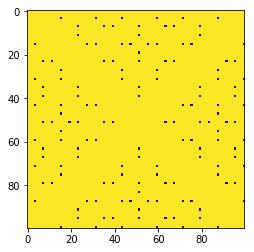

In [81]:
D_t=D_t+np.zeros(np.shape(D_t))
G_t=G_t+np.zeros(np.shape(G_t))
plt.imshow(D_t-G_t)
plt.show()

In [ ]:
plt.figure(figsize=(10,10))
plt.imshow(G_t,interpolation='bicubic')
plt.axis('off')
plt.show()
plt.figure(figsize=(10,10))
plt.imshow(D_t,interpolation='bicubic')
plt.axis('off')
plt.show()

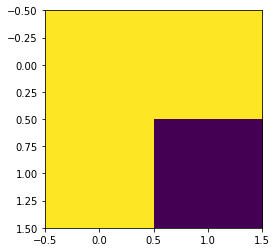

In [82]:
S=2
ind=np.outer(np.arange(S),np.ones(S))
X1=np.sign((ind-ind.T)-np.abs((ind-ind.T)))
#A1=np.sin((ind**2 +ind.T**2)**0.5)
#plt.imshow(A1,interpolation='nearest')
X2=np.flip(X1,0)
X=[]
X.extend((X1,X2))
#A=np.asarray(A)
plt.imshow(X2)

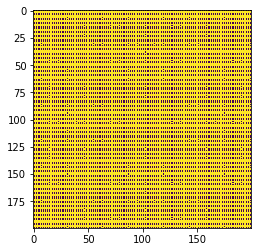

In [83]:
A=np.arange(4).reshape(2,2)
A=A+A.T
CA=np.zeros((S*N,S*N))
for i in range(N**2):
    r=i%N
    t=i//N
    #a=np.random.choice(a=np.delete(np.arange(3),[]),p=[0.1,0.6,0.3])
    a=BB[r][t]
    A=X[(a+(i%2))%2]
    #print(r)
    CA[S*r:S*r+S,S*t:S*t+S]=A
    i+=1
plt.imshow(CA)
#plt.axis('off')

plt.show()
 

In [40]:
D=np.zeros((N_step,N,N))
D

MemoryError: 